In [2]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
from pathlib import Path
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
from pathlib import Path
import os
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)


In [3]:
# dir_path = Path(r'C:\Users\adamyarschenko\OneDrive - University of Calgary\Head and Neck QoL Project')
dir_path = Path(r'C:\Users\The Supreme Being\OneDrive - University of Calgary\Head and Neck QoL Project')
file_location = Path(dir_path, r'Anonymized Data (Complete - 66-70 Gy).csv')

In [4]:
df = pd.read_csv(file_location)
df = df.set_index('QoLID')

#### Read the questions into their own dataframes

In [6]:
# MDASI = df.loc[:,'MDASI1':'MDASI_TOTAL_AVE']
# MDADI = df.loc[:, 'MDADI1':'MDADI_TOTAL_AVE']
MDASI = df.loc[:,'MDASI1':'MDASI_TOTAL_AVE']
MDADI = df.loc[:, 'MDADI1':'MDADI_TOTAL_AVE']
XQ = df.loc[:, 'XQ1':'XQ_TOTAL_AVE']

#### Read in data exported from RStudio to .csv.
MDADI and XQ categorical scores have been normalized to 100. <br>
MDASI has not been normalized. Scoring for the MDASI categories such as MDASI_CORE are done by taking the highest value from the corresponding group of questions. This is different than the summation performed in MDADI 

In [7]:
MDADI_norm = pd.read_csv(Path(dir_path, r'MDADI_Combined.csv'))
MDASI_combined = pd.read_csv(Path(dir_path, r'MDASI_Combined.csv'))
XQ_sum = XQ.loc[:,['XQ_EAT_SUM', 'XQ_NOTEAT_SUM', 'XQ_TOTAL_SUM']]
XQ_norm = XQ_sum[['XQ_EAT_SUM','XQ_NOTEAT_SUM']]*100/40 
XQ_norm = pd.concat([XQ_norm, XQ_sum['XQ_TOTAL_SUM']*100/80], axis=1)



### Survey Scoring Criteria

MDASI Symptom burden: none (item rating of 0); mild (1 to 4); moderate (5 to 6); or severe (7 to 10) 
Summary scores for each of the core, head and neck, and interference subgroups are defined by the maximum rating of any item within that subgroup. Subgroup symptom burden is interpreted as: none (all items rated 0); mild (all items rated <5 with at least one item rated ≥1); moderate (all items rated <7 with at least one item rate ≥5); severe (at least one item rated ≥7).

MDADI has Emptional (E), Physical (P), and Functional (F). Physical swallowing ability (8 items), functional impact of swallowing dysfunction (5 items), emotional impact (6 items), and the general influence of swallowing ability on daily life (1 item)
Rated on 5 point scale; strongly agree (1) to strongly disagree (5)(Higher symptom burden corresponds to lower score, low burden corresponds to low score). One item on the emotional subscale (I do not feel self-conscious when I eat) and another on the functional subscale (I feel free to go out to eat with my friends, neighbors, and relatives) were scored as 5 points for strongly agree and 1 point for strongly disagree. All other items were scored as 1 point for strongly agree and 5 points for strongly disagree.<br>
Values were converted to 1-5, summed, then normalized to 100. With this conversion, MDADI scores are interpreted as: minimal (summary score of 0 to 19), mild (20 to 39), moderate (40 to 59), severe (60 to 79), and profound (80 to 100) 

XQ rated 8 questions on eating (4), not eating (4). Totaled then normalized out of 100.

In [8]:
#Remove patients who have not completed all questions
df_filtered = df.dropna(subset=['MDADI16', 'XQ1'])

## Exploration on the Total_Sum scores

In [9]:
x = df_filtered['MDASI_TOTAL_SUM']
y = df_filtered['MDADI_TOTAL_SUM']
z = df_filtered['XQ_TOTAL_SUM']

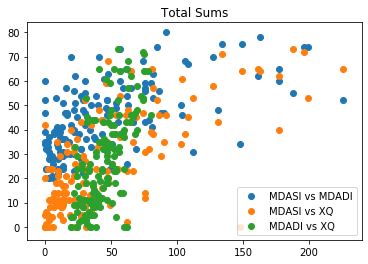

In [10]:
# plt.xlabel('MDASI_TOTAL_SUM')
# plt.ylabel('XQ_TOTAL_SUM')
plt.title('Total Sums')
plt.scatter(x,y, label='MDASI vs MDADI')
plt.scatter(x,z, label= 'MDASI vs XQ')
plt.scatter(y,z, label='MDADI vs XQ')
plt.legend()
plt.show()


MDADI vs XQ totals looks like stronger correlation. MDASI vs XQ weakest positive correlation. 

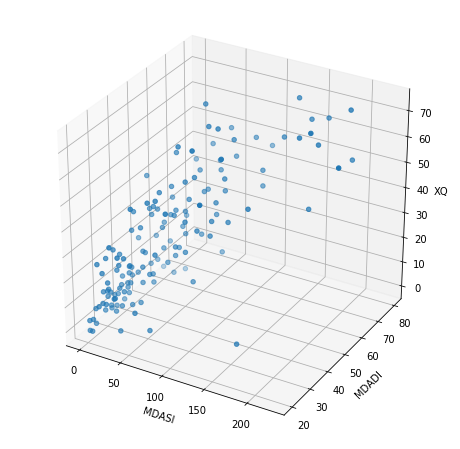

<Figure size 432x288 with 0 Axes>

In [11]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter3D(x,y,z)
ax.set_xlabel('MDASI')
ax.set_ylabel('MDADI')
ax.set_zlabel('XQ')
plt.show()
plt.savefig('3D Correlation.png')

General positive correlation between all three instrument totals. Most patients generally score higher on all if they've scored highly on one. 

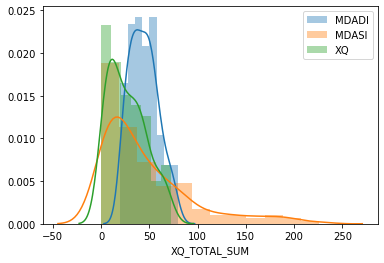

In [12]:
# plt.figure(figsize=(15,10))
plt.tight_layout()
sns.distplot(df['MDADI_TOTAL_SUM'], label='MDADI')
sns.distplot(df['MDASI_TOTAL_SUM'], label='MDASI')
sns.distplot(df['XQ_TOTAL_SUM'], label='XQ')
plt.legend()
plt.show()

General downward trend with most patients scoring low on instruments. Plot is not normalized so keep in mind that the maximum score on MDASI would be 280, MDADI 100, and XQ 80. Do not compare totals in chart above between instruments. 

In [13]:
# Grab all survey columns into 1 dataframe
survey_df = df_filtered.loc[:, 'MDASI1':]

In [14]:
# Take the category sum columns into a dataframe
category_sums = survey_df.loc[:, ['MDASI_CORE_SUM', 'MDASI_HN_SUM', 'MDASI_INT_SUM', 'MDADI_E_SUM', 
                               'MDADI_F_SUM', 'MDADI_P_SUM', 'XQ_EAT_SUM', 'XQ_NOTEAT_SUM']]

# Correlation Test Plots to Compare with '2020 Apr 29 (sw).docx'

In [20]:
# Plot to check correlations against '2020 Apr 29 (sw).docx'
list = ['MDASI_DryMouth', 'MDASI_Mucus', 'MDASI_SwallowChew', 'MDASI_ChokeCough', 'MDASI_Taste', 'MDASI_CORE', 'MDASI_HN', 'MDASI_INT', 'MDASI_ALL',]
corr_check = pd.concat([MDASI_combined.loc[:,list], MDADI_norm.loc[:, 'MDADI_COMPOSITE':], XQ_norm['XQ_TOTAL_SUM']], axis=1 )

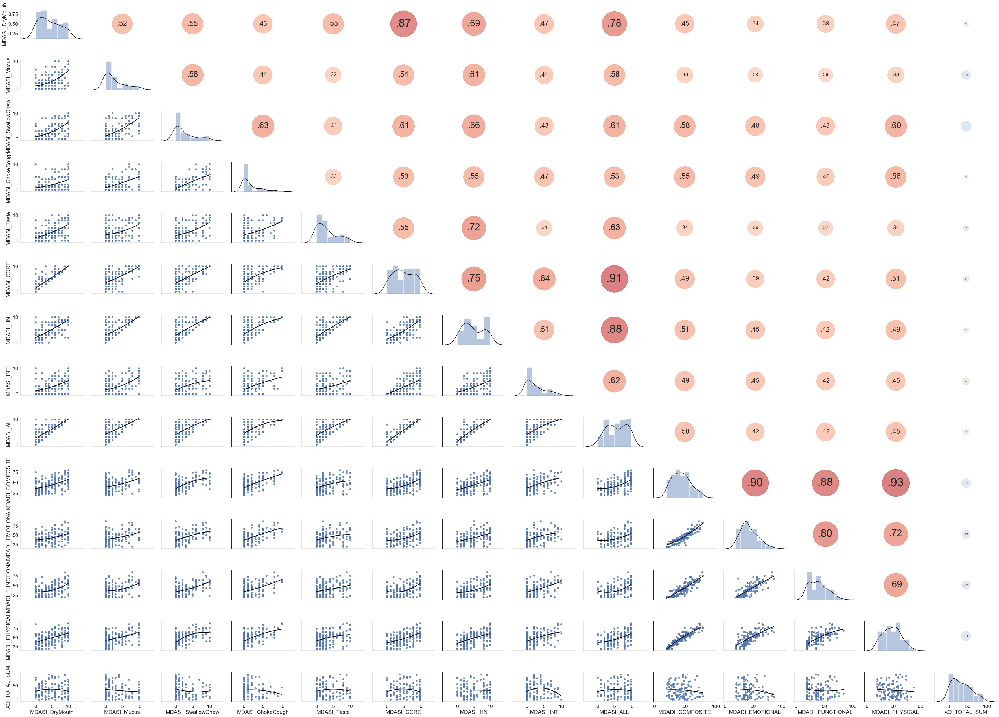

In [19]:
def corrdot(*args, **kwargs):
    corr_r = args[0].corr(args[1], 'spearman')
    corr_text = f"{corr_r:2.2f}".replace("0.", ".")
    ax = plt.gca()
    ax.set_axis_off()
    marker_size = abs(corr_r) * 10000
    ax.scatter([.5], [.5], marker_size, [corr_r], alpha=0.6, cmap="coolwarm",
               vmin=-1, vmax=1, transform=ax.transAxes)
    font_size = abs(corr_r) * 40 + 5
    ax.annotate(corr_text, [.5, .5,],  xycoords="axes fraction",
                ha='center', va='center', fontsize=font_size)

sns.set(style='white', font_scale=1.6)
g = sns.PairGrid(corr_check, aspect=1.4, diag_sharey=False)
plt.rcParams['figure.figsize']=(20,30)
# g.map_lower(sns.regplot, lowess=True, ci=False, line_kws={'color': 'black'})
g.map_lower(sns.regplot, order=2, ci=False, line_kws={'color': 'black'})
g.map_diag(sns.distplot, kde_kws={'color': 'black'})
g.map_upper(corrdot)
# g.savefig("Item Correlation Circles with Strength.png")
plt.show()

General trend of values matches '2020 Apr 29 (sw).docx' but cannot get the same values. Tried using raw data, normalized, spearman and person correlations.

# Individual item correlation
### MDASI vs MDADI

In [21]:
#MDASI vs MDADI
MDASIvMDADI = pd.concat([MDASI_combined.loc[:,'MDASI_Pain':'MDASI_EnjoyLife'], MDADI.loc[:,'MDADI1':'MDADI20']], axis=1)

In [39]:
# Full MDASI vs MDADI correlation matrix
############ This takes a really long time to run so the figre is saved to 'MDASIvsMDADI.png' and this code is commented out###############

from scipy.stats import pearsonr, spearmanr #person linear, spearman non-linear. Spearman used in Tyler paper. 
g = sns.pairplot(MDASIvMDADI, kind='reg', palette="Set2")
def corrfunc(x,y, ax=None, **kws):
    """Plot the correlation coefficient in the bottom right hand corner of a plot."""
    r, p = spearmanr(x, y)
    ax = ax or plt.gca()
    # Unicode for lowercase rho (ρ)
    rho = '\u03C1'
    ax.annotate(f'{rho} = {r:.2f}', xy=(.75, .15), xycoords=ax.transAxes)
    ax.annotate(f'P = {p:.6f}', xy=(.75, .05), xycoords=ax.transAxes)
#     ax.annotate('p < 0.001', xy=(.1, .8), xycoords=ax.transAxes)

g.map_lower(corrfunc)
plt.savefig('MDASIvsMDADI.png')
# plt.show()

In [22]:
# Get a list of correlations in MDASIvsMDADI, convert to upper triangular, removing redundant values.
MSIvMDI_corr = MDASIvMDADI.corr(method='spearman').round(3)
MSIvMDI_corr = MSIvMDI_corr.mask(np.triu(np.ones(MSIvMDI_corr.shape)).astype(np.bool))

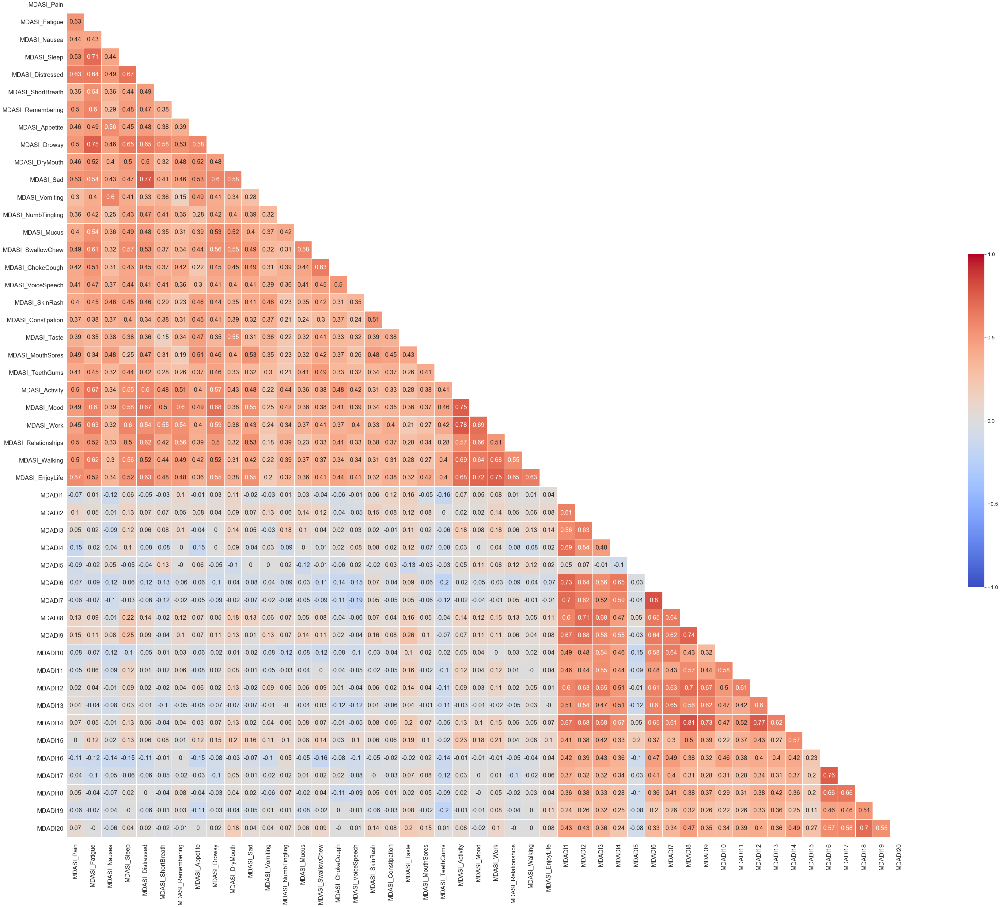

In [23]:
# Plot correlation matrix with heatmap
fig, ax = plt.subplots(figsize=(70, 50))

heatmap = sns.heatmap(MSIvMDI_corr.round(2),
                      square = True,
                      linewidths = .5,
                      cmap ='coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {'size': 20})

# Fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
# t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

# Add the column names as labels and change size.
ax.set_yticklabels(MSIvMDI_corr.columns, rotation = 0, size=20)
ax.set_xticklabels(MSIvMDI_corr.columns, size=20)
ax.tick_params(axis='x', which='major', pad=15)
ax.figure.savefig('MDASIvsMDADI Correlation Heatmap.png')
sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

Individual items on MDADI and MDASI do not correlate. MDADI5, 'I do not feel self-conscious when I eat,' is framed differently than the other questions (other than MDADI15). Figure above suggests that many patients answered quickly and were not conscious of this reversed wording. <br>
One would expect some questions to have strong correlation since there is correlation between categorical scores. Particularily MDASI15 (Your difficulty swallowing/chewing at its WORST) vs MDADI7 (P6. Swallowing takes great effort). Tried changing MDADI scale to 1-10 but same results. 

In [24]:
# Sort the correlation matrix highest to lowest only keeping values >= 0.5
cm = MSIvMDI_corr[abs(MSIvMDI_corr) >= 0.5].stack().reset_index()
cm.sort_values(by=[0], ascending=False)

,level_0,level_1,0
146,MDADI14,MDADI8,0.811
103,MDADI7,MDADI6,0.797
60,MDASI_Work,MDASI_Activity,0.776
149,MDADI14,MDADI12,0.773
22,MDASI_Sad,MDASI_Distressed,0.767
153,MDADI17,MDADI16,0.758
10,MDASI_Drowsy,MDASI_Fatigue,0.754
53,MDASI_Mood,MDASI_Activity,0.748
87,MDASI_EnjoyLife,MDASI_Work,0.748
115,MDADI9,MDADI8,0.744


In [26]:
## Trying using individual MDASI and normalized MDADI categories. 
MDASI_MDADINorm = pd.concat([MDASI_combined.loc[:,'MDASI_Pain':'MDASI_EnjoyLife'], MDADI_norm], axis=1 )
MDASI_MDADINorm = MDASI_MDADINorm.corr(method='spearman').round(3)
MDASI_MDADINorm = MDASI_MDADINorm.mask(np.triu(np.ones(MDASI_MDADINorm.shape)).astype(np.bool))

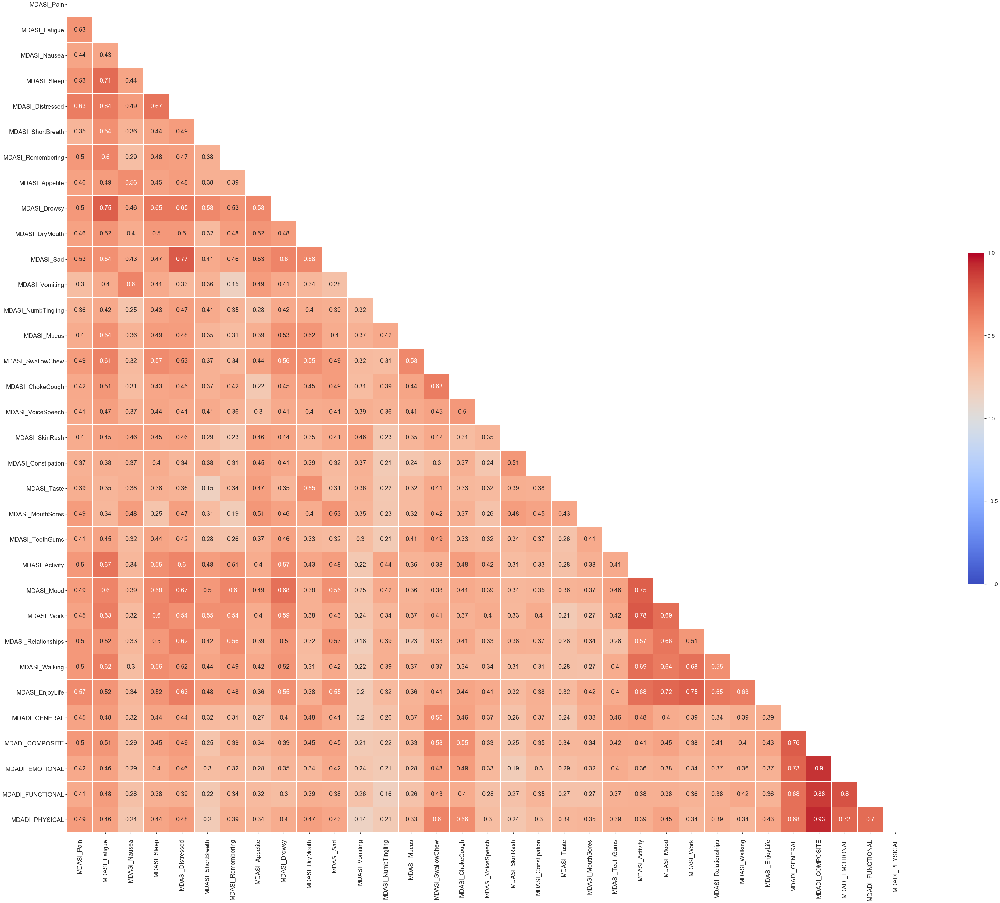

In [27]:
fig, ax = plt.subplots(figsize=(70, 50))

heatmap = sns.heatmap(MDASI_MDADINorm.round(2),
                      square = True,
                      linewidths = .5,
                      cmap ='coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {'size': 20})

# Fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
# t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

# Add the column names as labels and change size.
ax.set_yticklabels(MDASI_MDADINorm.columns, rotation = 0, size=20)
ax.set_xticklabels(MDASI_MDADINorm.columns, size=20)
ax.tick_params(axis='x', which='major', pad=15)

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

In [28]:
# Convert MDADI scores from 1-5 to 1-10
# MDADI scores converted to 1-10 by multiplying original scores 1-5 by 2. Note that the lowest possible score would be 2 after conversion. 
def convert_to10(item):
    return item*2
MDADI_to10 = MDADI.loc[:,'MDADI1':'MDADI20'].applymap(convert_to10)
## Trying using individual MDASI and normalized MDADI categories. 
MDASI_MDADIto10 = pd.concat([MDASI_combined.loc[:,'MDASI_Pain':'MDASI_EnjoyLife'], MDADI_to10], axis=1 )
MDASI_MDADIto10 = MDASI_MDADIto10.corr(method='spearman').round(3)
MDASI_MDADIto10 = MDASI_MDADIto10.mask(np.triu(np.ones(MDASI_MDADIto10.shape)).astype(np.bool))

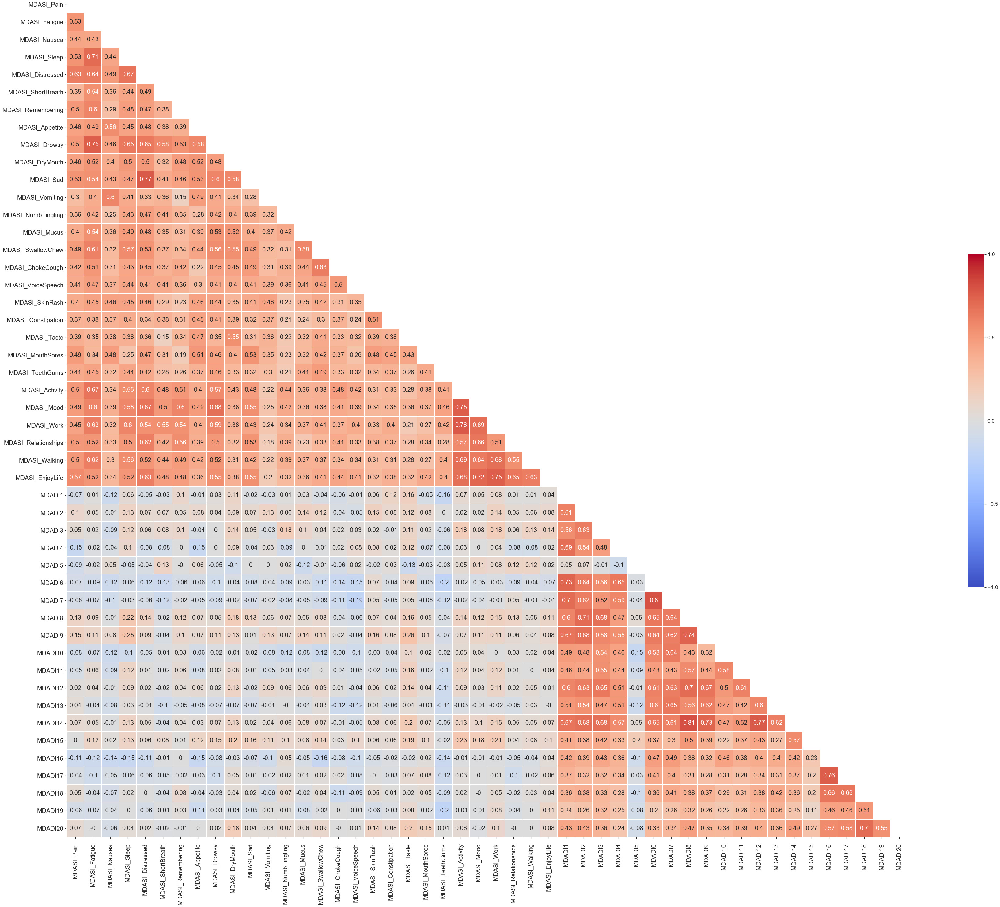

In [29]:
# Generate heat plot of correlation between individual MDASI items and MDADI items which have been converted to a 1-10 scale by doubling the original score. 
# This is to check the unexpected correlation plot of MDASIvsMDADI, and see if MDADI being scored 1-5 rather than 1-10 was the issue. 
fig, ax = plt.subplots(figsize=(70, 50))

heatmap = sns.heatmap(MDASI_MDADIto10.round(2),
                      square = True,
                      linewidths = .5,
                      cmap ='coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {'size': 20})

# Fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
# t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

# Add the column names as labels and change size.
ax.set_yticklabels(MDASI_MDADIto10.columns, rotation = 0, size=20)
ax.set_xticklabels(MDASI_MDADIto10.columns, size=20)
ax.tick_params(axis='x', which='major', pad=15)

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})


As expected, the correlation plots are the same. This is a good sanity check to make sure correlation algorithm is not dependent on the raw score. 

### MDASI vs XQ Correlations

In [31]:
#MDASI vs XQ
# Data is not normalized when comparing individual items between surveys.
MDASIvXQ = pd.concat([MDASI_combined.loc[:,'MDASI_Pain':'MDASI_EnjoyLife'], XQ.loc[:,'XQ1':'XQ8']], axis=1)

In [32]:
# Get a list of correlations in MDASIvsXQ, convert to upper triangular, removing redundant values.
MSIvXQ_corr = MDASIvXQ.corr(method='spearman').round(3)
MSIvXQ_corr = MSIvXQ_corr.mask(np.triu(np.ones(MSIvXQ_corr.shape)).astype(np.bool))

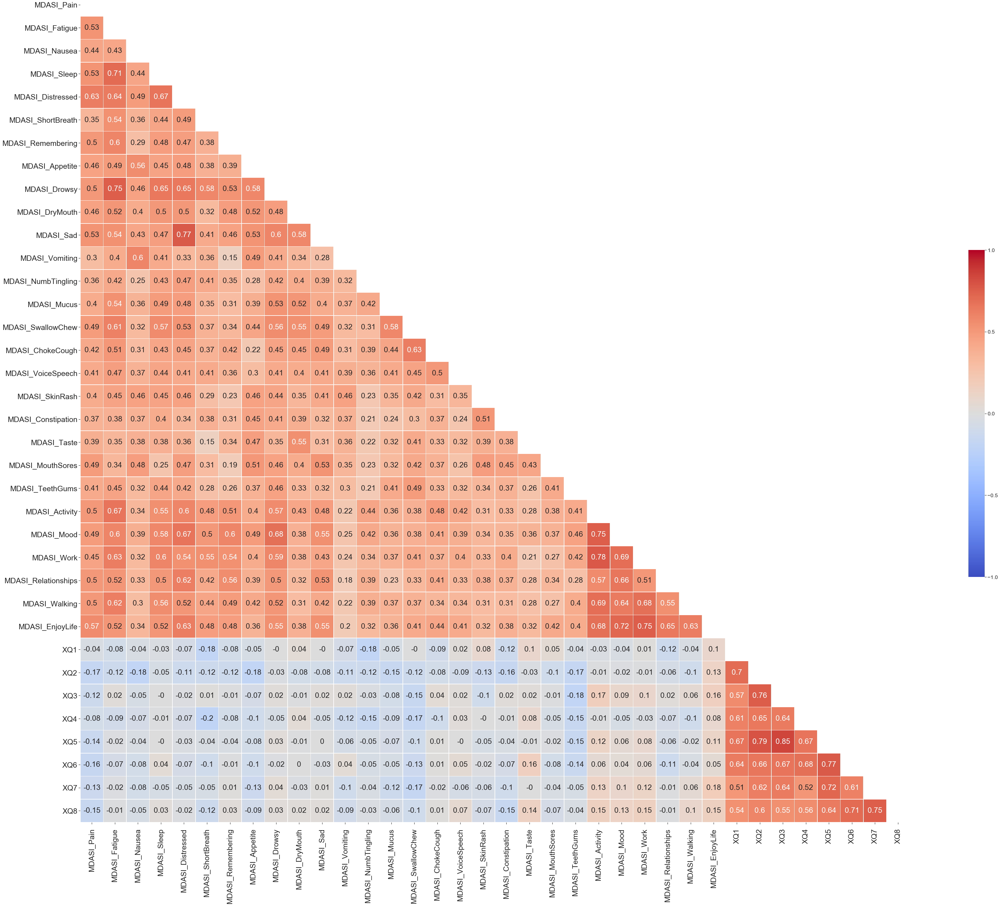

In [33]:
# Plot correlation matrix with heatmap
fig, ax = plt.subplots(figsize=(70, 50))

heatmap = sns.heatmap(MSIvXQ_corr.round(2),
                      square = True,
                      linewidths = .5,
                      cmap ='coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {'size': 25})

# Fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
# t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

# Add the column names as labels and change size.
ax.set_yticklabels(MSIvXQ_corr.columns, rotation = 0, size=25)
ax.set_xticklabels(MSIvXQ_corr.columns, size=25)
ax.tick_params(axis='x', which='major', pad=15)

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

In [34]:
# Sort the correlation matrix highest to lowest keeping only values >= 0.5
cm = MSIvXQ_corr[abs(MSIvXQ_corr) >= 0.5].stack().reset_index()
cm.sort_values(by=[0], ascending=False)

,level_0,level_1,0
98,XQ5,XQ3,0.851
97,XQ5,XQ2,0.791
60,MDASI_Work,MDASI_Activity,0.776
104,XQ6,XQ5,0.771
22,MDASI_Sad,MDASI_Distressed,0.767
92,XQ3,XQ2,0.761
10,MDASI_Drowsy,MDASI_Fatigue,0.754
117,XQ8,XQ7,0.753
53,MDASI_Mood,MDASI_Activity,0.748
87,MDASI_EnjoyLife,MDASI_Work,0.748


### MDADI vs XQ Correlations

In [35]:
# Data is not normalized when comparing individual items between surveys.
MDADIvXQ = pd.concat([MDADI.loc[:, 'MDADI1':'MDADI20'], XQ.loc[:, 'XQ1':'XQ8']], axis=1)
# Get a list of correlations in MDADIvXQ, convert to upper triangular, removing redundant values.
MDIvXQ_corr = MDADIvXQ.corr(method='spearman').round(3)
MDIvXQ_corr = MDIvXQ_corr.mask(np.triu(np.ones(MDIvXQ_corr.shape)).astype(np.bool))

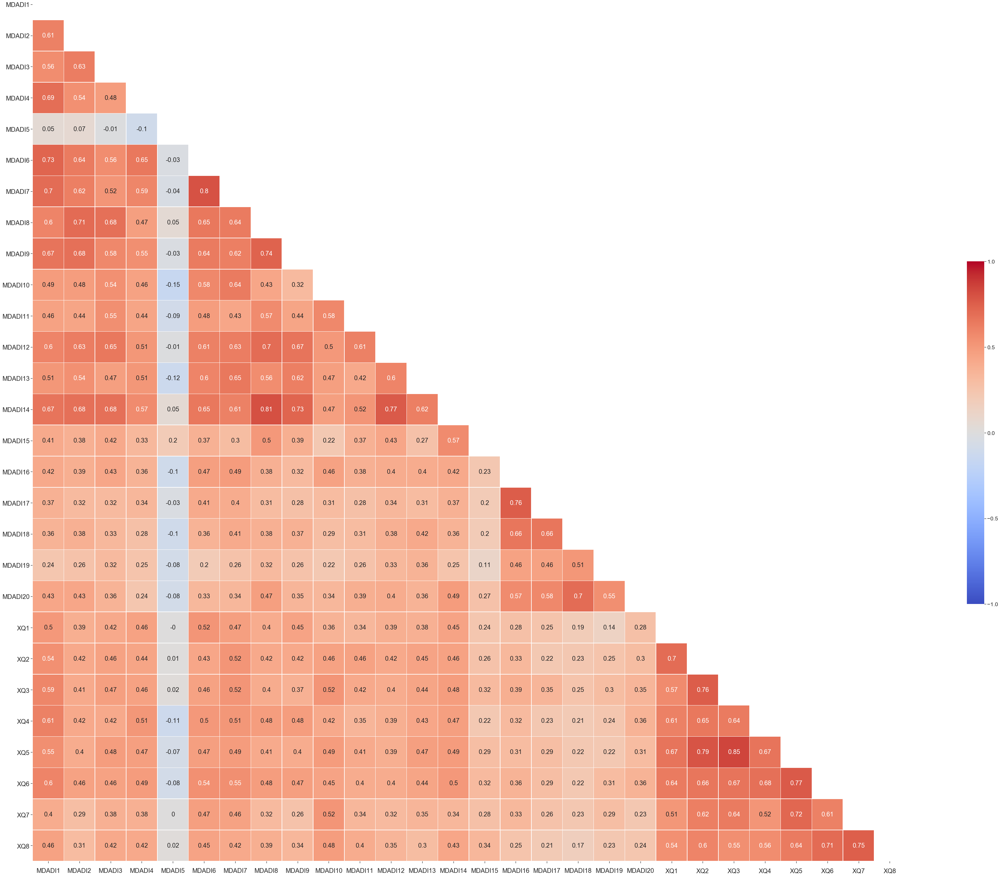

In [36]:
# Plot correlation matrix with heatmap
fig, ax = plt.subplots(figsize=(70, 50))

heatmap = sns.heatmap(MDIvXQ_corr.round(2),
                      square = True,
                      linewidths = .5,
                      cmap ='coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {'size': 20})

# Fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
# t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

# Add the column names as labels and change size.
ax.set_yticklabels(MDIvXQ_corr.columns, rotation = 0, size=20)
ax.set_xticklabels(MDIvXQ_corr.columns, size=20)
ax.tick_params(axis='x', which='major', pad=15)

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

In [37]:
# Sort the correlation matrix highest to lowest
cm = MDIvXQ_corr[abs(MDIvXQ_corr) >= 0.5].stack().reset_index()
cm.sort_values(by=[0], ascending=False)

,level_0,level_1,0
91,XQ5,XQ3,0.851
56,MDADI14,MDADI8,0.811
13,MDADI7,MDADI6,0.797
90,XQ5,XQ2,0.791
59,MDADI14,MDADI12,0.773
101,XQ6,XQ5,0.771
80,XQ3,XQ2,0.761
63,MDADI17,MDADI16,0.758
115,XQ8,XQ7,0.753
25,MDADI9,MDADI8,0.744


# Categorical Correlations

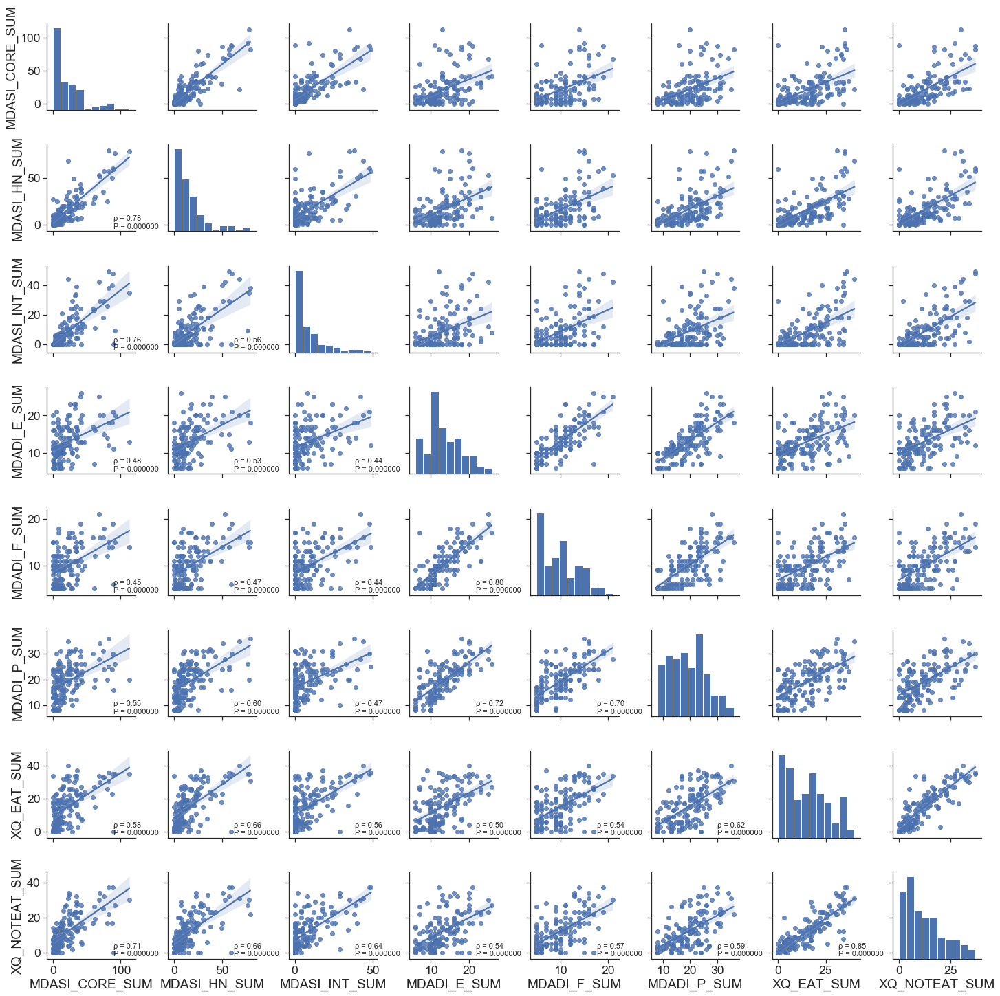

In [42]:
from scipy.stats import pearsonr, spearmanr #person linear, spearman non-linear. Spearman used in Tyler paper. 
g = sns.pairplot(category_sums, kind='reg', palette="Set2")
def corrfunc(x,y, ax=None, **kws):
    """Plot the correlation coefficient in the bottom right hand corner of a plot."""
    r, p = spearmanr(x, y)
    ax = ax or plt.gca()
    # Unicode for lowercase rho (ρ)
    rho = '\u03C1'
    ax.annotate(f'{rho} = {r:.2f}', xy=(.75, .12), xycoords=ax.transAxes, fontsize=11)
    ax.annotate(f'P = {p:.6f}', xy=(.75, .03), xycoords=ax.transAxes, fontsize=11)
#     ax.annotate('p < 0.001', xy=(.1, .8), xycoords=ax.transAxes)

g.map_lower(corrfunc)
plt.show()

Shaded area is 95% confidence interval
Histogram distributions from ablove plot show skewed data, therefore nonparametric statistics are relevant. 

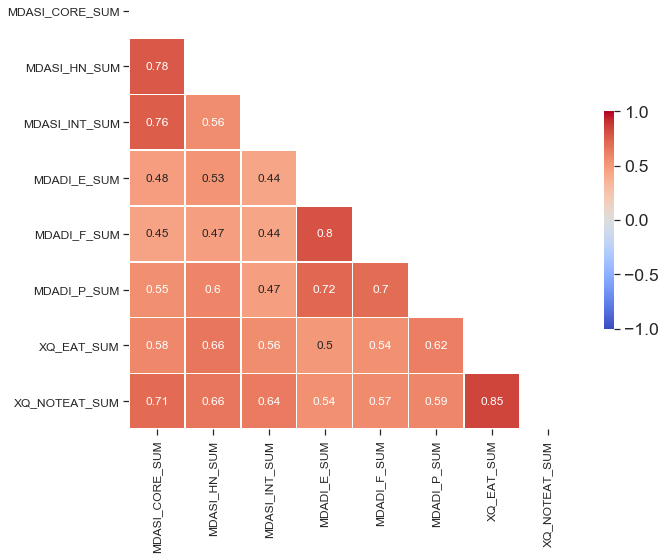

In [43]:
category_sums_corr = category_sums.corr(method='spearman').round(3)
category_sums_corr = category_sums_corr.mask(np.triu(np.ones(category_sums_corr.shape)).astype(np.bool))
# Plot correlation matrix with heatmap
fig, ax = plt.subplots(figsize=(10, 10))

heatmap = sns.heatmap(category_sums_corr.round(2),
                      square = True,
                      linewidths = .5,
                      cmap ='coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {'size': 12})

# Fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
# t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

# Add the column names as labels and change size.
ax.set_yticklabels(category_sums_corr.columns, rotation = 0, size=12)
ax.set_xticklabels(category_sums_corr.columns, size=12)
ax.tick_params(axis='x', which='major', pad=5)

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

Why do categorical scores correlate with MDASI but there is no correlation to individual items? 

# Heatmaps

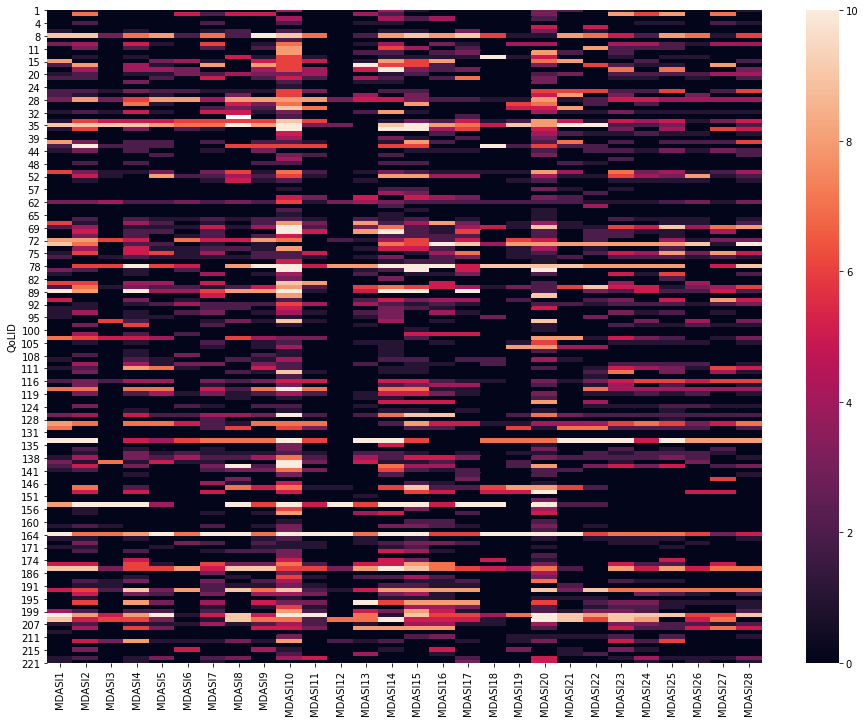

In [47]:
fig = plt.figure(figsize=(16,12))
sns.heatmap(MDASI.loc[:, "MDASI1":"MDASI28"])

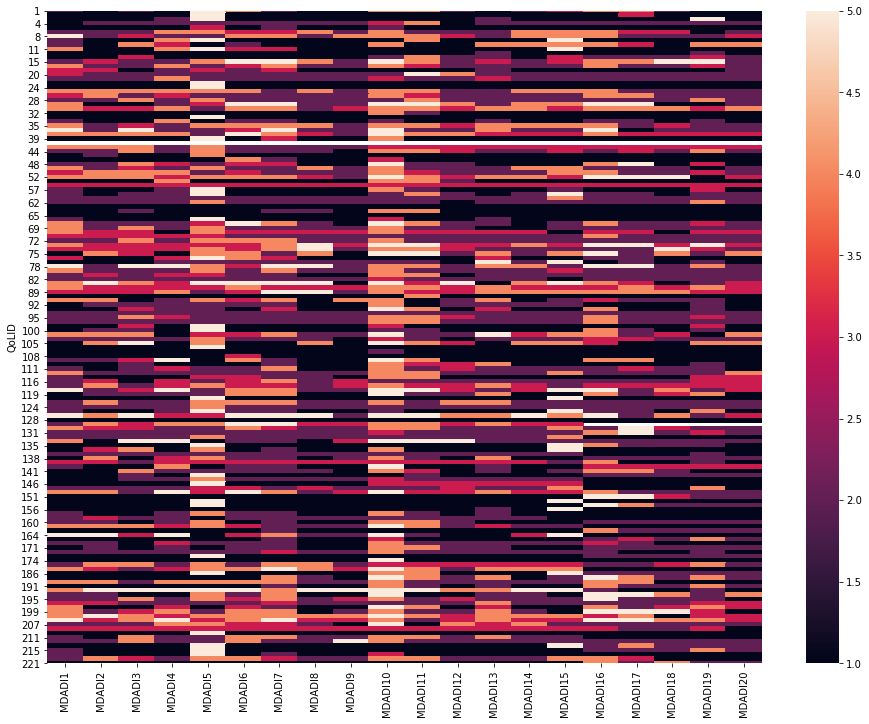

In [48]:
fig = plt.figure(figsize=(16,12))
sns.heatmap(MDADI.iloc[:, 0:20])

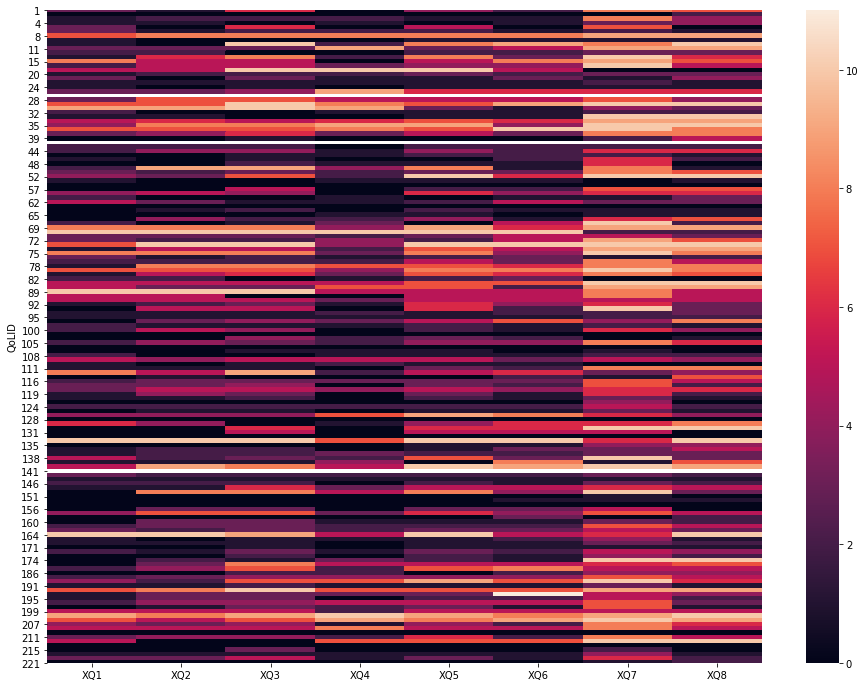

In [49]:
fig = plt.figure(figsize=(16,12))
sns.heatmap(XQ.iloc[:, 0:8])

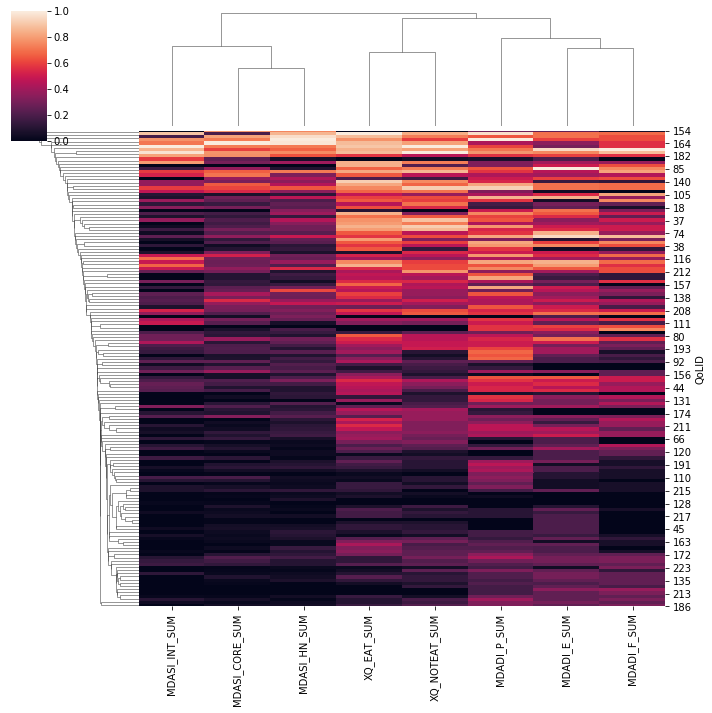

In [50]:
# fig = plt.figure(figsize=(16,12))
sns.clustermap(category_sums, metric="euclidean", standard_scale=1, method="single")

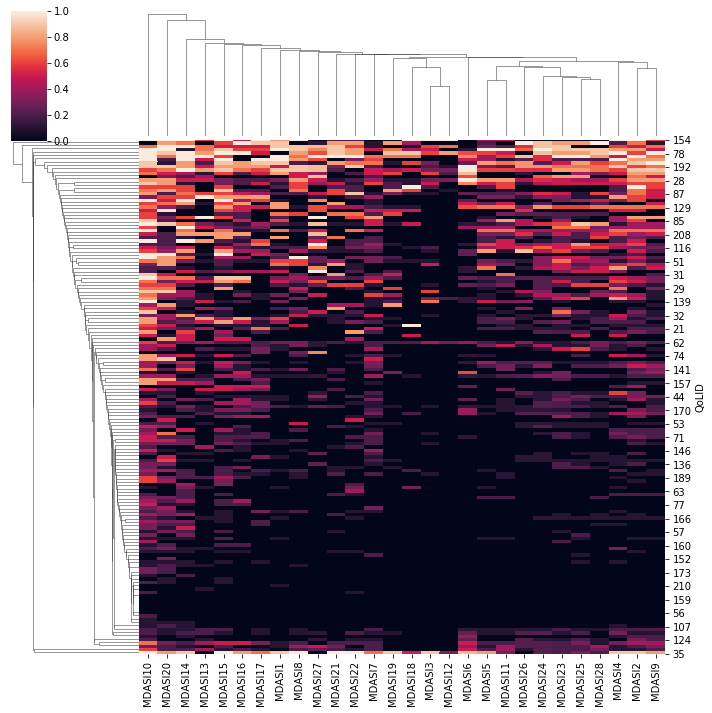

In [51]:
sns.clustermap(MDASI.dropna().iloc[:, :28], metric="euclidean", standard_scale=1, method="single")

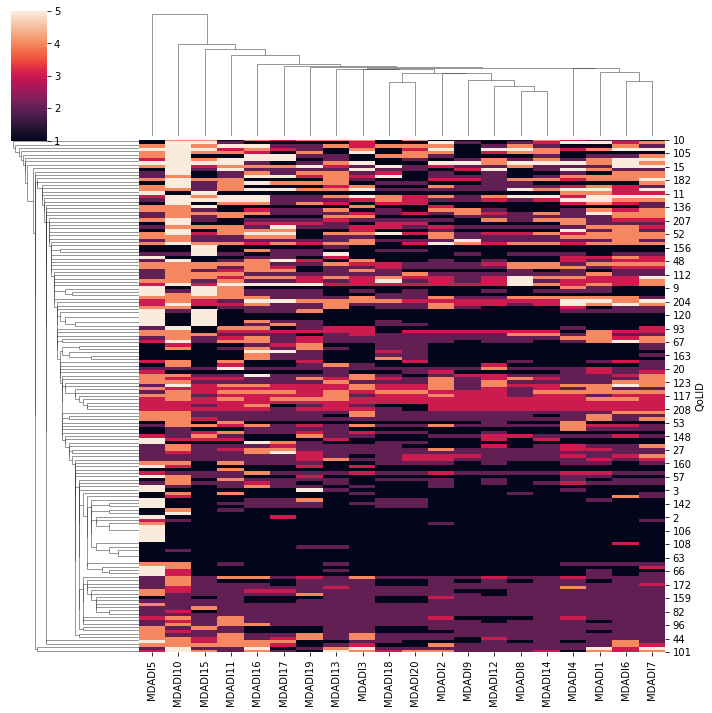

In [52]:
# sns.clustermap(MDADI.dropna().iloc[:, 0:20], metric="euclidean", standard_scale=1, method="single")
sns.clustermap(MDADI.dropna().iloc[:, 0:20], metric="euclidean", method="single", figsize=(10, 10))

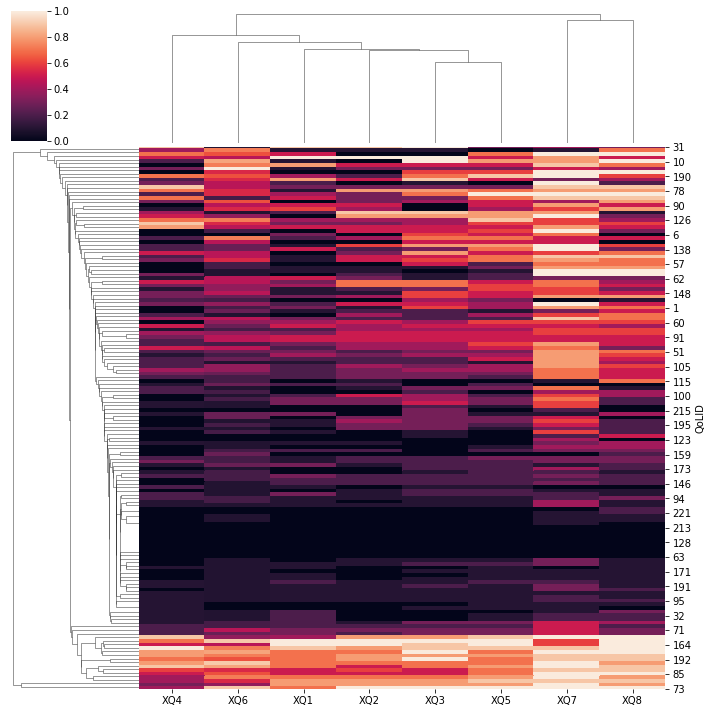

In [53]:
sns.clustermap(XQ.dropna().iloc[:, 0:8], metric="euclidean", standard_scale=1, method="single")

# Mann-Whitney tests. How similar are the populations?

### Mann-Whitney on Survey totals

In [46]:
stat, p = mannwhitneyu(MDASI['MDASI_TOTAL_SUM'], MDADI['MDADI_TOTAL_SUM'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distribution (fail to reject H0)')
else:
	print('Different distribution (reject H0)')

Statistics=9418.000, p=0.001
Different distribution (reject H0)


In [47]:
stat, p = mannwhitneyu(MDASI['MDASI_TOTAL_SUM'], XQ['XQ_TOTAL_SUM'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distribution (fail to reject H0)')
else:
	print('Different distribution (reject H0)')

Statistics=10139.500, p=0.009
Different distribution (reject H0)


In [48]:
stat, p = mannwhitneyu(MDADI['MDADI_TOTAL_SUM'], XQ['XQ_TOTAL_SUM'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distribution (fail to reject H0)')
else:
	print('Different distribution (reject H0)')

Statistics=6150.000, p=0.000
Different distribution (reject H0)


### Mann-Whitney on Categories

### Perform Mann-Whitney U test to identify if the samples are drawn from the same distribution

In [128]:
#Get filtered lists of which combinations were rejected or accepted
rejh0 = []
accepth0 = []
p_values = np.zeros((len(category_sums.columns), len(category_sums.columns)))
for i in range(len(category_sums.columns)):
    for j in range(i+1, len(category_sums.columns)):
        stat, p = mannwhitneyu(category_sums.iloc[:, i], category_sums.iloc[:, j])
        p_values[i][j] = p
        alpha = 0.05
        if p > alpha:
            compare = category_sums.columns[i] + ' vs ' + category_sums.columns[j]
            accepth0.append(compare)
#             print('Same distribution (fail to reject H0) \n')
        else:
            compare = category_sums.columns[i] + ' vs ' + category_sums.columns[j]
            rejh0.append(compare)
#             print('Different distribution (reject H0)\n')

### These categories are statistically different

In [129]:
# Rejected h0
rejh0

['MDASI_CORE_SUM vs MDASI_INT_SUM',
 'MDASI_CORE_SUM vs MDADI_F_SUM',
 'MDASI_CORE_SUM vs MDADI_P_SUM',
 'MDASI_CORE_SUM vs XQ_NOTEAT_SUM',
 'MDASI_HN_SUM vs MDASI_INT_SUM',
 'MDASI_HN_SUM vs MDADI_E_SUM',
 'MDASI_HN_SUM vs MDADI_P_SUM',
 'MDASI_INT_SUM vs MDADI_E_SUM',
 'MDASI_INT_SUM vs MDADI_F_SUM',
 'MDASI_INT_SUM vs MDADI_P_SUM',
 'MDASI_INT_SUM vs XQ_EAT_SUM',
 'MDASI_INT_SUM vs XQ_NOTEAT_SUM',
 'MDADI_E_SUM vs MDADI_F_SUM',
 'MDADI_E_SUM vs MDADI_P_SUM',
 'MDADI_E_SUM vs XQ_NOTEAT_SUM',
 'MDADI_F_SUM vs MDADI_P_SUM',
 'MDADI_F_SUM vs XQ_EAT_SUM',
 'MDADI_P_SUM vs XQ_EAT_SUM',
 'MDADI_P_SUM vs XQ_NOTEAT_SUM',
 'XQ_EAT_SUM vs XQ_NOTEAT_SUM']

### These categories are statistically similar

In [130]:
# Fail to reject h0
accepth0

['MDASI_CORE_SUM vs MDASI_HN_SUM',
 'MDASI_CORE_SUM vs MDADI_E_SUM',
 'MDASI_CORE_SUM vs XQ_EAT_SUM',
 'MDASI_HN_SUM vs MDADI_F_SUM',
 'MDASI_HN_SUM vs XQ_EAT_SUM',
 'MDASI_HN_SUM vs XQ_NOTEAT_SUM',
 'MDADI_E_SUM vs XQ_EAT_SUM',
 'MDADI_F_SUM vs XQ_NOTEAT_SUM']

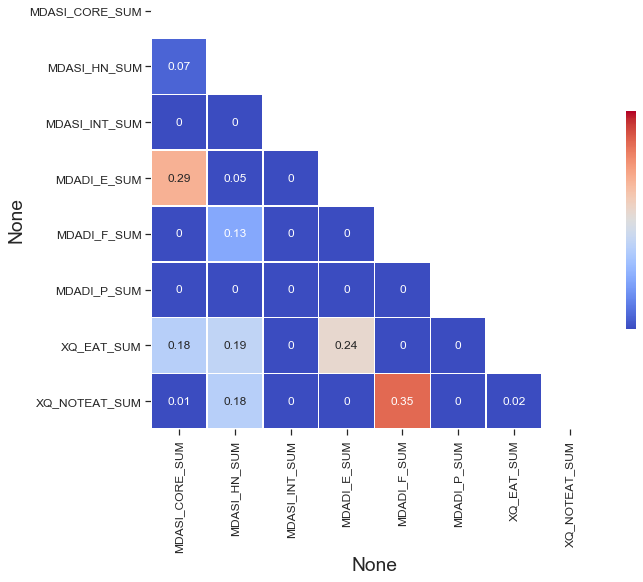

In [131]:
#Plot of heatmap of how statistically similar the categories are
p_table = pd.DataFrame(np.transpose(p_values), columns=[category_sums.columns], index=[category_sums.columns])
p_table = p_table.mask(np.triu(np.ones(p_table.shape)).astype(np.bool))
# Plot correlation matrix with heatmap
fig, ax = plt.subplots(figsize=(10, 10))

heatmap = sns.heatmap(p_table.round(2),
                      square = True,
                      linewidths = .5,
                      cmap ='coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = 0.05,
                      vmax = 0.4,
                      annot = True,
                      annot_kws = {'size': 12})

# Fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottomm
# t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

# Add the column names as labels and change size.
ax.set_yticklabels(category_sums_corr.columns, rotation = 0, size=12)
ax.set_xticklabels(category_sums_corr.columns, size=12)
ax.tick_params(axis='x', which='major', pad=5)

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

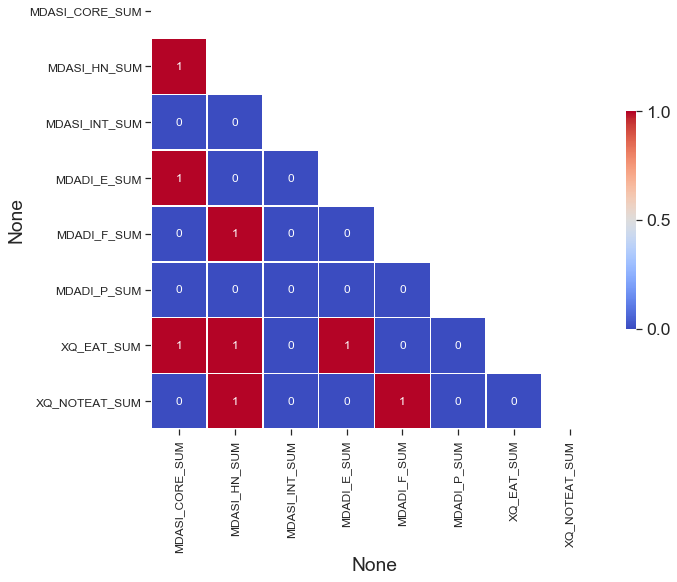

In [132]:
# Plot a heatmap of the decision to accept or reject the null hypothesis. 
acc_rej = p_table >= 0.05 #fail to reject h0 (accept they are the same distribution)
acc_rej = acc_rej.mask(np.triu(np.ones(acc_rej.shape)).astype(np.bool))
# Plot correlation matrix with heatmap
fig, ax = plt.subplots(figsize=(10, 10))

heatmap = sns.heatmap(acc_rej,
                      square = True,
                      linewidths = .5,
                      cmap ='coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = 0,
                      vmax = 1,
                      annot = True,
                      annot_kws = {'size': 12})

# Fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottomm
# t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values

# Add the column names as labels and change size.
ax.set_yticklabels(category_sums_corr.columns, rotation = 0, size=12)
ax.set_xticklabels(category_sums_corr.columns, size=12)
ax.tick_params(axis='x', which='major', pad=5)

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

Red squares represent similar categories.